# Single-cell RNA-seq data 
Dimension reduction for single-cell RNA-seq data simplifies high-dimensional gene expression data into fewer dimensions. Techniques like PCA, t-SNE, and UMAP highlight biological patterns and cell heterogeneity, facilitating visualization and analysis by reducing computational complexity and noise.

In [1]:
import anndata as nd
import numpy as np 
import scanpy as sp
import pandas as pd 
import scanpy as sc
import matplotlib.pyplot as plt
import scvi
import warnings
warnings.filterwarnings('ignore')

import rna 

# Load Data

In [2]:
sc_data = sp.read_10x_mtx("data/filtered_gene_bc_matrices/hg19/", var_names="gene_symbols", cache=True)
sc_data.var_names_make_unique()

In [3]:
# Load the data
sc_data = sc.read_10x_mtx("data/filtered_gene_bc_matrices/hg19/", var_names="gene_symbols", cache=True)
sc_data.var_names_make_unique()

# Call the function to display the attributes with context and separation
rna.display_anndata_attributes_with_context(sc_data)


Shape of the data (cells x genes): (2700, 32738)

--------------------------------------------------

.X (Data Matrix):
This matrix contains the expression levels of genes across cells.
Each entry represents the expression level of a gene in a cell.
Data matrix shape: (2700, 32738)
Sample data:


--------------------------------------------------

.obs (Cell Metadata):
Metadata for each cell. Each row is a cell, columns include cell-specific info.
Empty DataFrame
Columns: []
Index: [AAACATACAACCAC-1, AAACATTGAGCTAC-1, AAACATTGATCAGC-1, AAACCGTGCTTCCG-1, AAACCGTGTATGCG-1]

--------------------------------------------------

.obs_names (Cell Identifiers):
Unique identifiers for each cell.
Index(['AAACATACAACCAC-1', 'AAACATTGAGCTAC-1', 'AAACATTGATCAGC-1',
       'AAACCGTGCTTCCG-1', 'AAACCGTGTATGCG-1'],
      dtype='object')

--------------------------------------------------

.var (Gene Metadata):
Metadata for each gene. Each row is a gene, columns include gene-specific info.
            

In [4]:
!mkdir write
results_file = "write/pbmc3k.h5ad"

A subdirectory or file write already exists.


# Data preprocessing 
Visualize number of genes per cell and number of cells per gene with highlighted thresholds.

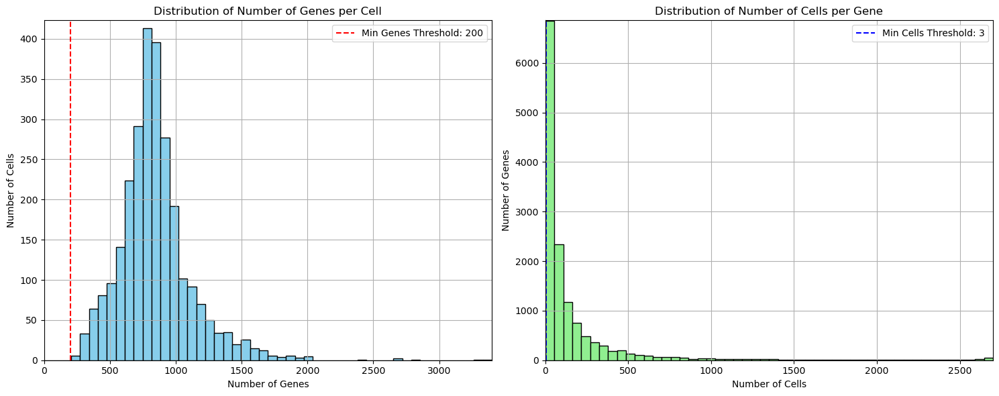

In [5]:
# Define minimum thresholds
min_genes = 200
min_cells = 3  # Example threshold for minimum cells per gene

# Apply filters
sc.pp.filter_cells(sc_data, min_genes=min_genes)
sc.pp.filter_genes(sc_data, min_cells=min_cells)

# Visualize the distributions with zoom on thresholds
rna.visualize_gene_and_cell_counts(sc_data, min_genes, min_cells)

In the below plot, top 10 most expressed genes are presented. MALAT1 has the highest expression which is a long non-coding RNA involved in gene regulation. It plays a significant role in cancer progression, influencing cell migration, invasion, and metastasis. MALAT1 is a potential biomarker and therapeutic target.

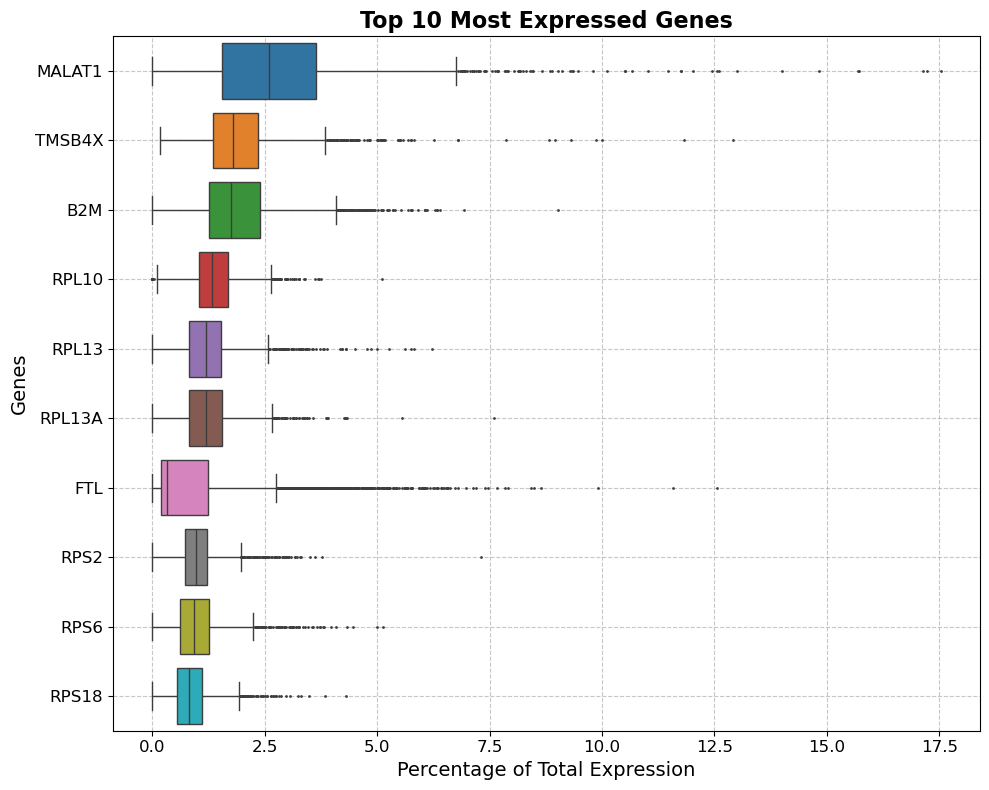

In [6]:
# Define number of top genes to show
top_n = 10

# Plot the highest expressed genes
rna.plot_highest_genes(sc_data, top_n)

### Quality Check
This process involves identifying ribosomal genes in single-cell RNA-seq data, recalculating quality control metrics to include these genes, and then visualizing the updated metrics.Ribosomal genes are critical to monitor in single-cell RNA-seq data because their high expression levels can indicate technical artifacts or issues with cell quality. Mitochondrial genes (mt) are also important because high expression levels can indicate stressed or dying cells. 

In this study, cells with too many mitochondrial genes expressed or too many total counts.

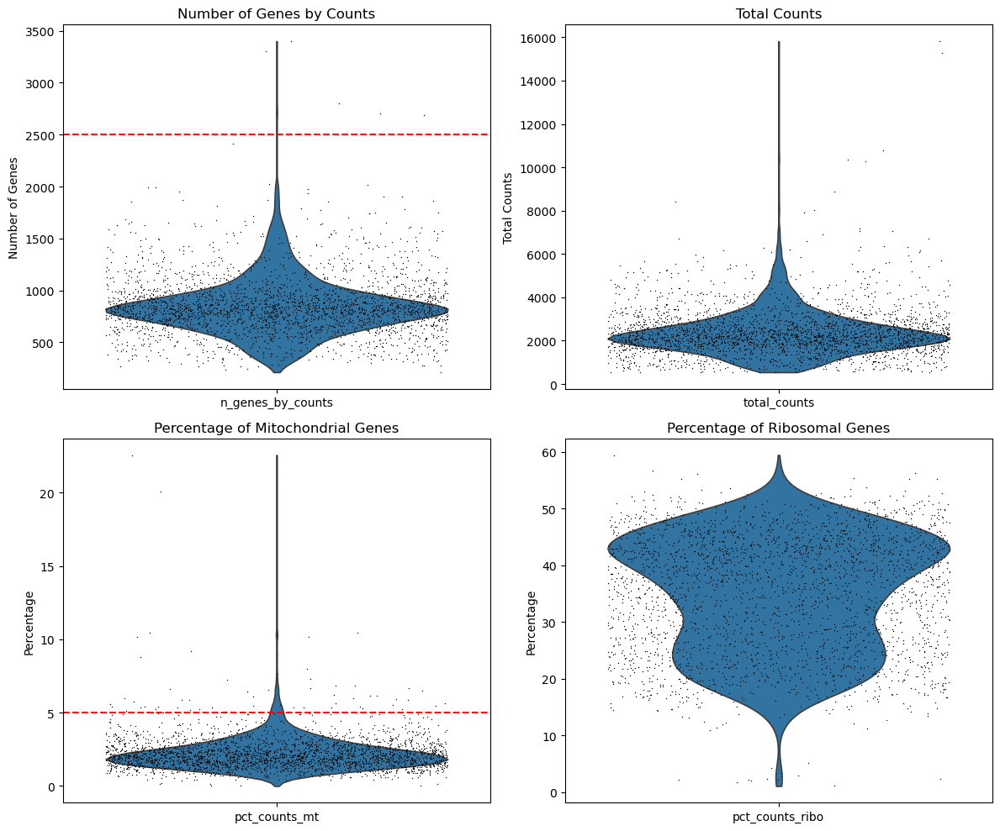

In [7]:
thresholds = {
    'n_genes_by_counts': 2500,  # threshold for number of genes
    'pct_counts_mt': 5,         # threshold for percentage of mitochondrial genes
}

rna.plot_qc_metrics(sc_data, thresholds)

sc_data = sc_data[sc_data.obs.n_genes_by_counts < thresholds['n_genes_by_counts'], :]
sc_data = sc_data[sc_data.obs.pct_counts_mt < thresholds['pct_counts_mt'], :]



### Normalization
Normalization and log transformation are crucial in single-cell RNA-seq data processing to ensure accurate analysis. Normalization adjusts for differences in sequencing depth between cells by scaling the data to a common total count, thus correcting for technical biases. Log transformation stabilizes variance and handles zero values, making the data more normally distributed and suitable for statistical methods. These steps enhance comparability, reduce bias, and improve visualization by making patterns in gene expression more apparent and manageable.

In [8]:
sc_data.layers["counts"] = sc_data.X
sc.pp.normalize_total(sc_data, target_sum=1e4)
sc.pp.log1p(sc_data)

Highly variable genes can be identified and plotted.

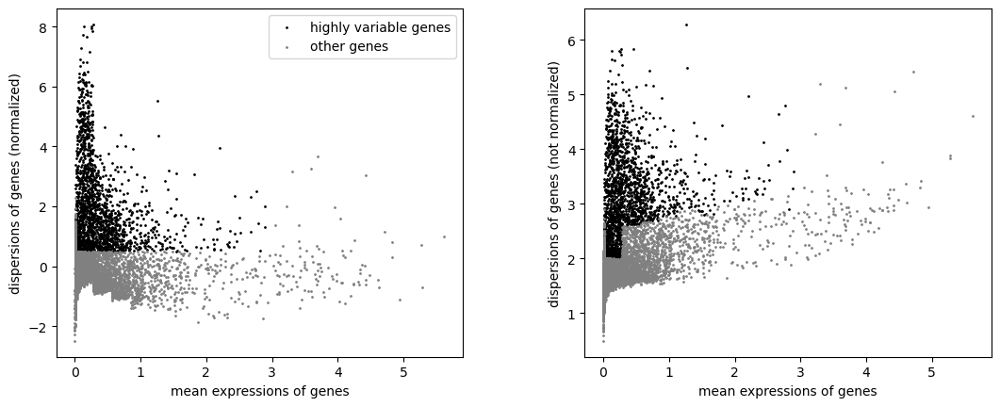

In [9]:
sc.pp.highly_variable_genes(sc_data, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(sc_data)

Dataset is filtered to include only highly variable genes. It also regresses out unwanted variations, such as total counts and mitochondrial gene percentages, to reduce noise. Finally, the data is scaled, capping values at 10, to standardize expression levels for better downstream analysis.

In [10]:
sc_data.raw = sc_data
sc_data = sc_data[:, sc_data.var.highly_variable]
sc.pp.regress_out(sc_data, ["total_counts", "pct_counts_mt"])
sc.pp.scale(sc_data, max_value=10)

# Principal Component Analysis (PCA)



In [11]:
sc.tl.pca(sc_data, n_comps=100, svd_solver='arpack')

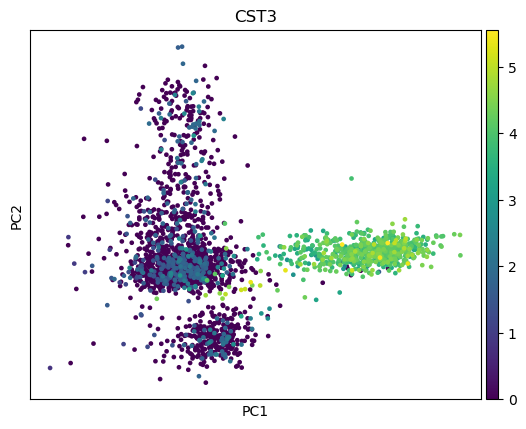

In [12]:
sc.pl.pca(sc_data, color='CST3')

To see how many PCs we need to use:

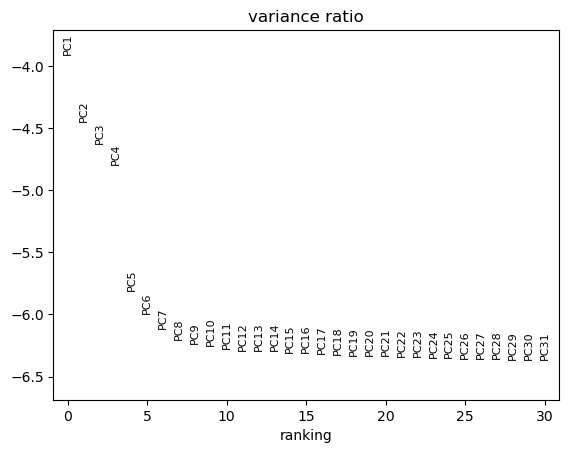

In [13]:
sc.pl.pca_variance_ratio(sc_data, log=True)
sc_data.write(results_file)

The Leiden algorithm is then applied to identify clusters within the data. Following this, Partition-based Graph Abstraction (PAGA) is used to infer a coarse-grained representation of the connectivity between clusters. The UMAP algorithm is then run, initially informed by the PAGA graph to provide a more accurate initialization, followed by a final UMAP run to obtain a refined visualization of the data's structure.

In [14]:
sc.pp.neighbors(sc_data, n_neighbors=10, n_pcs=40)
sc.tl.leiden(sc_data)
sc.tl.paga(sc_data)
sc.pl.paga(sc_data, plot=False) 
sc.tl.umap(sc_data, init_pos='paga')
sc.tl.umap(sc_data)

The UMAP plot is visualized, coloring by CST3, NKG7, and PPBP expression levels to highlight their distribution across identified cell clusters.

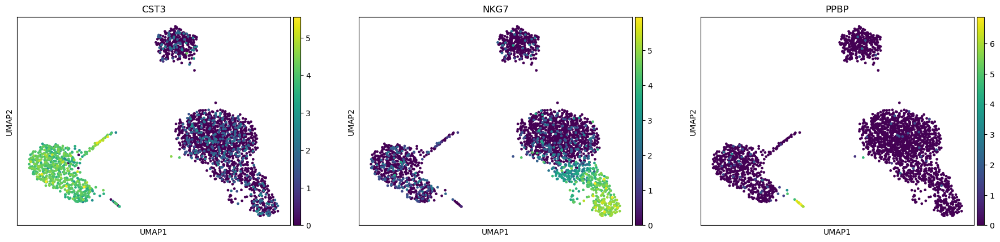

In [15]:
sc.pl.umap(sc_data, color=["CST3", "NKG7", "PPBP"])

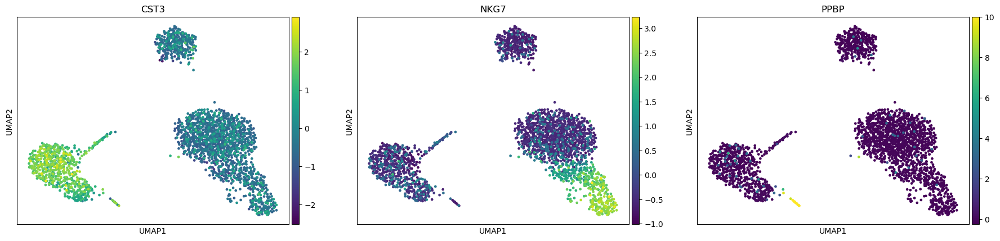

In [16]:
sc.pl.umap(sc_data, color=["CST3", "NKG7", "PPBP"], use_raw=False)

In [17]:
sc_data.write(results_file)

Let's quickly jump to t-SNE visualization and Single-cell Variational Inference (SCVI) to explore how dimensionality reduction and latent representations can reveal meaningful patterns and clusters in single-cell RNA-seq data.

# t-distributed stochastic neighbourhood embedding (tSNE)



t-SNE (t-Distributed Stochastic Neighbor Embedding) is a dimensionality reduction technique used to visualize high-dimensional data in a lower-dimensional space. It aims to preserve the local structure of the data, so similar data points stay close together in the reduced dimensions, while dissimilar points are spread out. The parameters control aspects like the balance between preserving local and global structure (perplexity), the initial emphasis on structure (early exaggeration), and the speed of optimization (learning rate).

In [45]:
sc.tl.tsne(sc_data, 
            n_pcs=10, #10
            perplexity=20, #30 
            early_exaggeration=12, #12 
            learning_rate=200, #1000
            random_state=6, #0
            metric="euclidean"
)

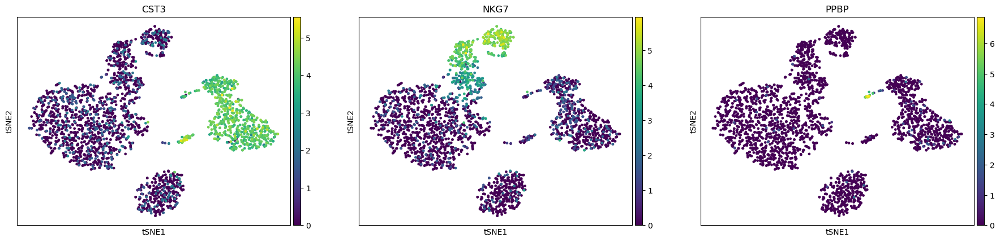

In [46]:
sc.pl.tsne(sc_data, color=["CST3", "NKG7", "PPBP"])


# Single-cell Variational Inference (scVI)



The workflow involves using SCVI, a tool for variational autoencoder-based analysis. First, highly variable genes are identified in the data. SCVI is then set up with the count layer and trained with a specified architecture (2 layers, 2 latent dimensions) to learn a **latent representation** of the data. After training, this latent representation is added to the dataset. Finally, the data is visualized using this new representation, with embeddings colored by cluster assignments ("leiden") and gene expressions (CST3, NKG7).

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 100/100: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [01:21<00:00,  1.24it/s, v_num=1, train_loss_step=555, train_loss_epoch=521]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [01:21<00:00,  1.23it/s, v_num=1, train_loss_step=555, train_loss_epoch=521]


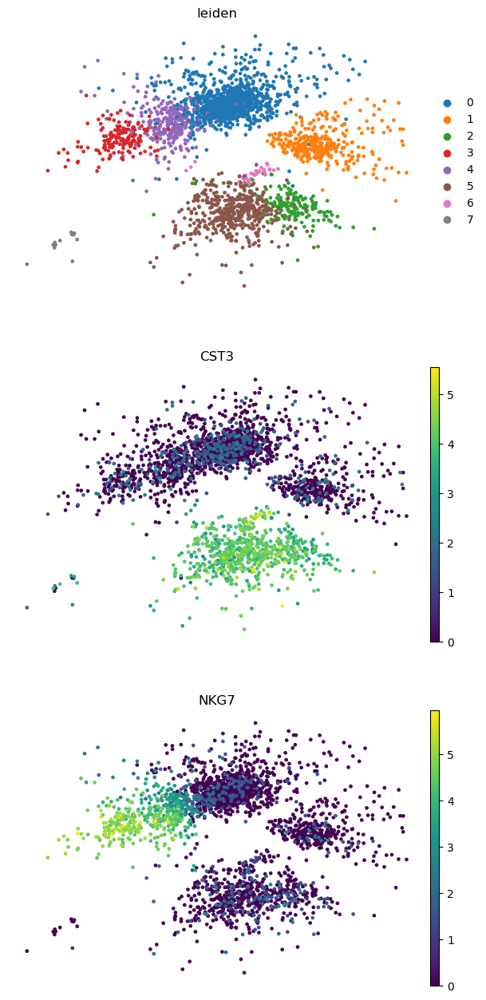

In [49]:
sc_data_scvi = sc_data.copy()
# Identify highly variable genes using Seurat v3 method and subset the data to these genes
sc.pp.highly_variable_genes(
    sc_data_scvi,
    flavor="seurat_v3",
    n_top_genes=2000,
    layer="counts",
    subset=True
)

# Set up SCVI with the count layer of the data
scvi.model.SCVI.setup_anndata(sc_data_scvi, layer="counts")

# Initialize SCVI model with specified parameters: 2 layers, 2 latent dimensions, and negative binomial likelihood
vae = scvi.model.SCVI(sc_data_scvi, n_layers=2, n_latent=2, gene_likelihood="nb")

# Train the SCVI model for a maximum of 100 epochs
vae.train(max_epochs=100)

# Add the learned latent representation to the original data
sc_data.obsm["X_scVI"] = vae.get_latent_representation()

# Visualize the data using the SCVI latent representation, colored by Leiden clusters and gene expressions (CST3, NKG7)
sc.pl.embedding(
    sc_data,
    basis="X_scVI",
    frameon=False,
    ncols=1,
    color=["leiden", "CST3", "NKG7"]
)

# Clustering using Leiden algorithm

The Leiden algorithm was applied to identify clusters of cells, using a resolution of 0.9 and a random seed of 0 to ensure reproducibility. The clustering was performed with the igraph flavor, running for 2 iterations on an undirected graph. Lets apply clustering using the Leiden algorithm. The clustering is done on the neighborhood graph created in the previous step based on PCA analysis.


In [50]:
sc.read(results_file)

AnnData object with n_obs × n_vars = 2638 × 1838
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'leiden'
    var: 'gene_ids', 'n_cells', 'ribo', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'logreg', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 't-test', 'umap', 'wilcoxon'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [41]:
try:
    sc.tl.leiden(
        sc_data,
        resolution=0.9,
        random_state=0,
        flavor="igraph",
        n_iterations=2,
        directed=False,
    )
except ValueError as e:
    print(f"ValueError: {e}")


Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", li

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", li

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.randint
  File "_bounded_integers.pyx", line 1336, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "mtrand.pyx", line 763, in numpy.random.mtrand.RandomState.r

The UMAP plot displays the clustering of cells based on their expression profiles, with colors indicating the Leiden clusters and expression levels of various genes. The genes visualized include high expressed markers for different cell types.


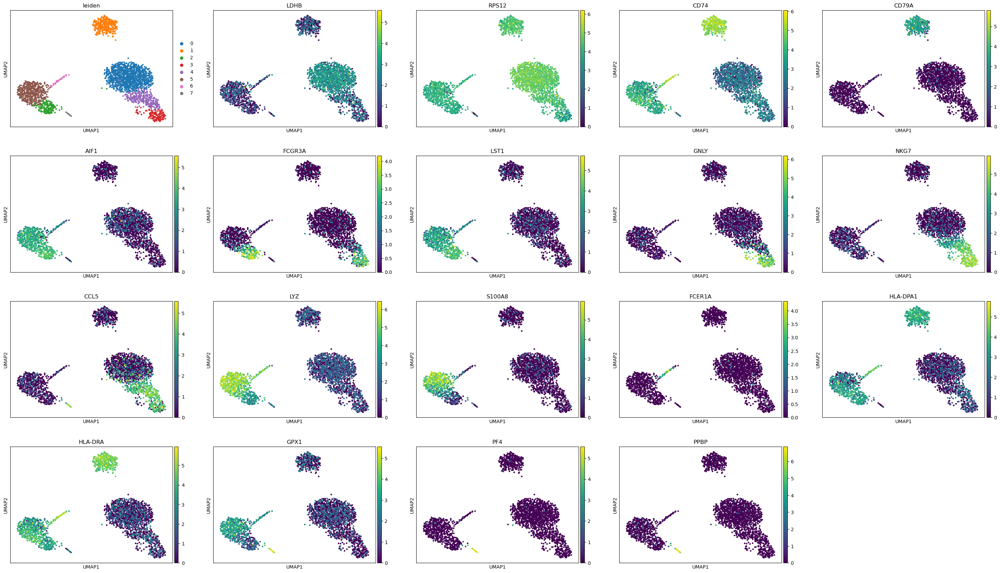

In [25]:
sc.pl.umap(sc_data, color=['leiden', 'LDHB',
 'RPS12',
 'CD74',
 'CD79A',
 'AIF1',
 'FCGR3A',
 'LST1',
 'GNLY',
 'NKG7',
 'CCL5',
 'LYZ',
 'S100A8',
 'FCER1A',
 'HLA-DPA1',
 'HLA-DRA',
 'GPX1',
 'PF4',
 'PPBP'], ncols=5)

The PAGA comparison plot visualizes the connectivity and relationships between identified clusters, highlighting how the clusters are connected based on a threshold of 0.1. This plot provides an overview of the cell cluster graph structure, allowing for the assessment of cluster separability and potential lineage relationships within the dataset.


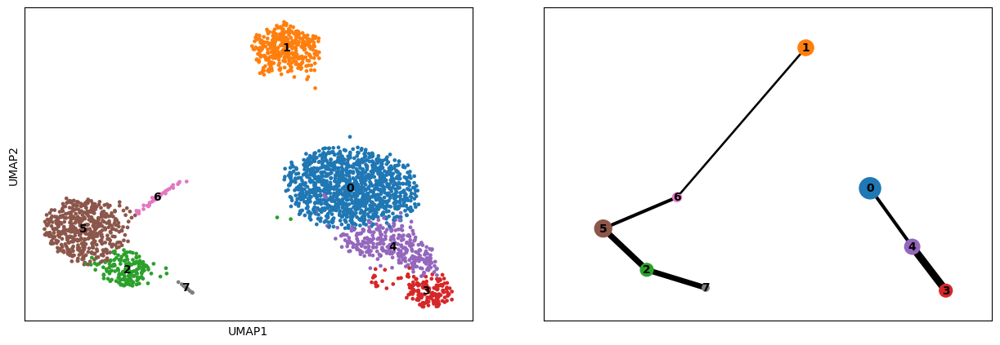

[<Axes: xlabel='UMAP1', ylabel='UMAP2'>, <Axes: >]

In [27]:
sc.pl.paga_compare(sc_data, threshold=0.1, title='', frameon=True)

# Biomarker Genes

We performed differential expression analysis to identify marker genes for each Leiden cluster using three different methods: t-test, Wilcoxon rank-sum test, and logistic regression. For each method, the top 25 marker genes were visualized.  This comprehensive analysis allows for robust identification of cluster-specific marker genes across different statistical approaches.


Generating plot for t-test differential expression analysis...


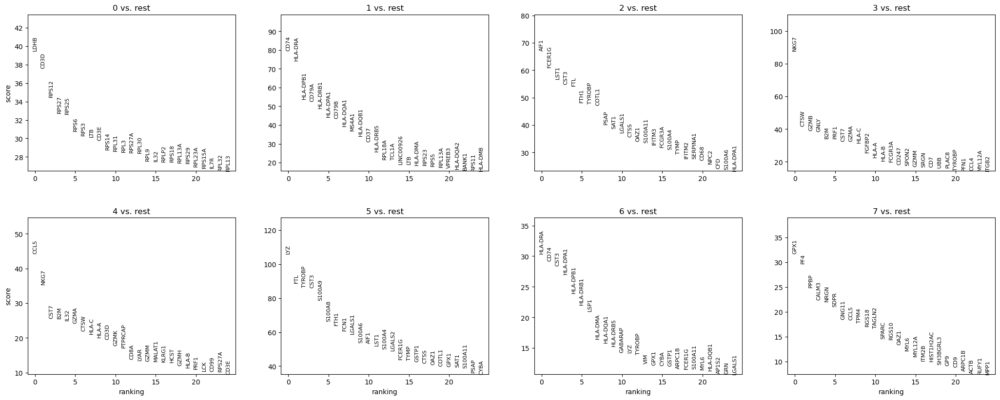


Generating plot for Wilcoxon rank-sum test differential expression analysis...


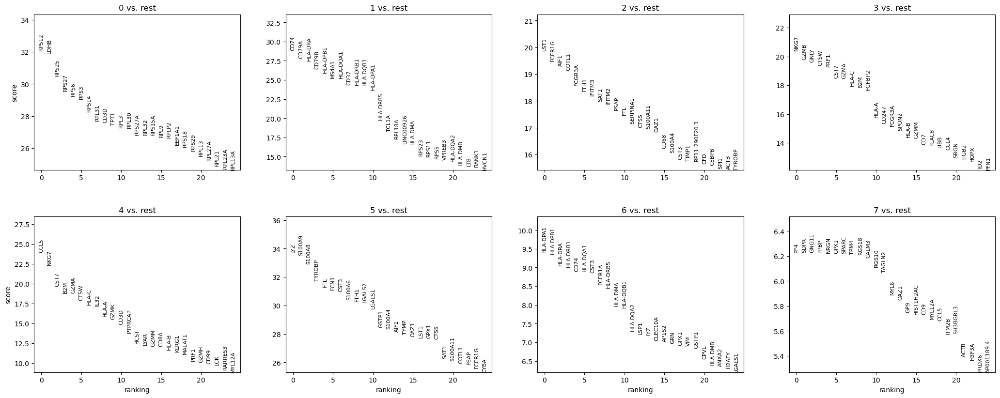


Generating plot for logistic regression differential expression analysis...


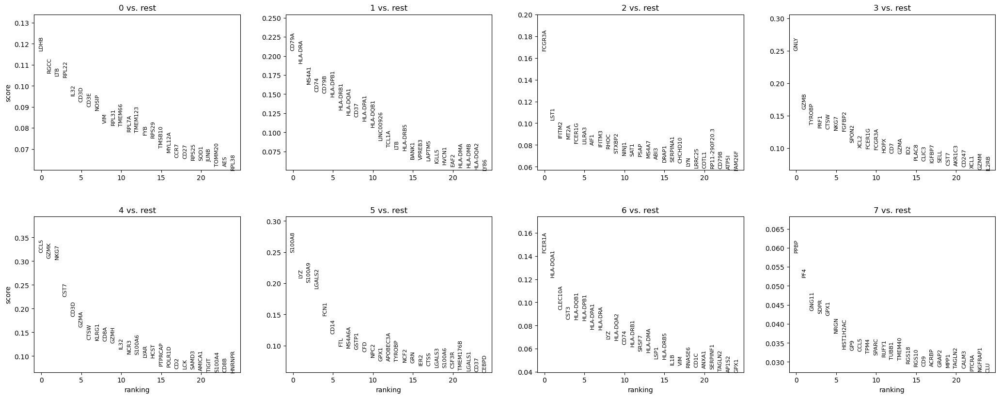

In [43]:
# Perform differential expression analysis using t-test
sc.tl.rank_genes_groups(sc_data, 'leiden', method='t-test')
print("Generating plot for t-test differential expression analysis...")
sc.pl.rank_genes_groups(sc_data, n_genes=25, sharey=False, title='t-test Differential Expression Analysis')

# Store results and save
sc_data.uns['t-test'] = sc_data.uns['rank_genes_groups']
sc_data.write(results_file)

# Perform differential expression analysis using Wilcoxon rank-sum test
sc.tl.rank_genes_groups(sc_data, 'leiden', method='wilcoxon')
print("\nGenerating plot for Wilcoxon rank-sum test differential expression analysis...")
sc.pl.rank_genes_groups(sc_data, n_genes=25, sharey=False, title='Wilcoxon Rank-Sum Test Differential Expression Analysis')

# Store results and save
sc_data.uns['wilcoxon'] = sc_data.uns['rank_genes_groups']
sc_data.write(results_file)

# Perform differential expression analysis using logistic regression
sc.tl.rank_genes_groups(sc_data, 'leiden', method='logreg')
print("\nGenerating plot for logistic regression differential expression analysis...")
sc.pl.rank_genes_groups(sc_data, n_genes=25, sharey=False, title='Logistic Regression Differential Expression Analysis')

# Store results and save
sc_data.uns['logreg'] = sc_data.uns['rank_genes_groups']
sc_data.write(results_file)


A Venn diagram was created to compare the top 25 marker genes identified using Wilcoxon rank-sum test, t-test, and logistic regression methods. The diagram illustrates the overlap and unique genes across these three methods, highlighting similarities and differences in the marker gene sets identified by each approach.


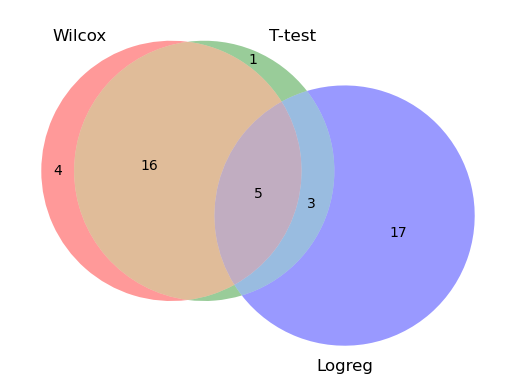

In [29]:
wc = sc_data.uns['wilcoxon']['names']['0'][:25]
tt = sc_data.uns['t-test']['names']['0'][:25]
lr = sc_data.uns['logreg']['names']['0'][:25]
from matplotlib_venn import venn3

venn3([set(wc),set(tt),set(lr)], ('Wilcox','T-test','Logreg') )
plt.show()


The resulting `top_gene_table` provides a comprehensive list of the most significant genes across all clusters, offering insights into key gene expressions in the dataset.


In [30]:
top_gene_table = rna.extract_top_genes(sc_data)
top_gene_table

,Cluster,Top Gene (t-test),Top Gene (wilcoxon),Top Gene (logreg),Final Top Gene
0,0,LDHB,RPS12,LDHB,"LDHB, RPS12"
1,1,CD74,CD74,CD79A,"CD74, CD79A"
2,2,AIF1,LST1,FCGR3A,"AIF1, FCGR3A, LST1"
3,3,NKG7,NKG7,GNLY,"GNLY, NKG7"
4,4,CCL5,CCL5,CCL5,CCL5
5,5,LYZ,LYZ,S100A8,"LYZ, S100A8"
6,6,HLA-DRA,HLA-DPA1,FCER1A,"FCER1A, HLA-DPA1, HLA-DRA"
7,7,GPX1,PF4,PPBP,"GPX1, PF4, PPBP"


Cell types are added to the table for all clusters.

| Cluster                | Top Gene (t-test) | Top Gene (wilcoxon) | Top Gene (logreg) | Final Top Gene                       | Cell Type                        |
|------------------------|-------------------|---------------------|-------------------|-------------------------------------|----------------------------------|
| CD4 T                  | LDHB              | RPS12              | LDHB              | LDHB, RPS12                         | CD4 T                            |
| B                      | CD74              | CD74                | CD79A             | CD74, CD79A                         | B cells                          |
| FCGR3A+ Monocytes      | AIF1              | LST1                | FCGR3A            | AIF1, FCGR3A, LST1                  | FCGR3A+ Monocytes                |
| NK                     | NKG7              | NKG7                | GNLY              | GNLY, NKG7                          | NK cells                         |
| CD8 T                  | CCL5              | CCL5                | CCL5              | CCL5                                | CD8 T                            |
| CD14+ Monocytes        | LYZ               | LYZ                 | S100A8            | LYZ, S100A8                         | CD14+ Monocytes                  |
| Dendritic              | HLA-DRA           | HLA-DPA1            | FCER1A            | FCER1A, HLA-DPA1, HLA-DRA           | Dendritic Cells                  |
| Megakaryocytes         | GPX1              | PF4                 | PPBP              | GPX1, PF4, PPBP                     | Megakaryocytes                   |


Margers genes are listed in `marker_genes`.

In [31]:
final_top_genes = top_gene_table["Final Top Gene"].str.split(", ").explode().unique()
marker_genes = list(final_top_genes)
marker_genes

['LDHB',
 'RPS12',
 'CD74',
 'CD79A',
 'AIF1',
 'FCGR3A',
 'LST1',
 'GNLY',
 'NKG7',
 'CCL5',
 'LYZ',
 'S100A8',
 'FCER1A',
 'HLA-DPA1',
 'HLA-DRA',
 'GPX1',
 'PF4',
 'PPBP']

A heatmap was generated to visualize the top 5 marker genes for each cluster identified by the t-test method. The heatmap, grouped by the Leiden clusters, displays the expression levels of these genes, with gene labels included for easy identification. This visualization helps to assess the differential expression patterns across clusters.


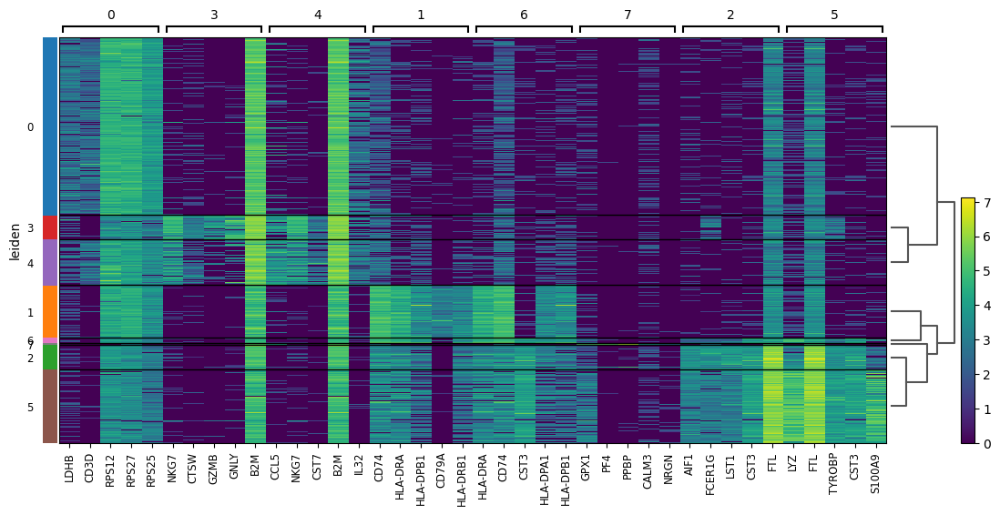

In [32]:
sc.pl.rank_genes_groups_heatmap(sc_data, n_genes=5, key="t-test", groupby="leiden", show_gene_labels=True)

The below table organizes the top marker genes and their p-values from the t-test results stored in t-test appraoch. Columns represent clusters and the corresponding gene names and p-values.


In [34]:
result = sc_data.uns['t-test']  
groups = result["names"].dtype.names
pd.DataFrame(
    {
        group + "_" + key[:1]: result[key][group]
        for group in groups
        for key in ["names", "pvals"]
    }
).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,5_n,5_p,6_n,6_p,7_n,7_p
0,LDHB,8.977617e-269,CD74,0.000000e+00,AIF1,2.934167e-224,NKG7,3.040814e-226,CCL5,2.434743e-155,LYZ,0.0,HLA-DRA,6.560269e-32,GPX1,1.326433e-13
1,CD3D,1.114454e-247,HLA-DRA,0.000000e+00,FCER1G,9.562518e-184,CTSW,8.516231e-99,NKG7,1.029732e-122,FTL,0.0,CD74,2.552733e-31,PF4,1.251720e-12
2,RPS12,3.829672e-210,HLA-DPB1,2.257039e-272,LST1,1.451644e-148,GZMB,1.502140e-84,CST7,4.222969e-81,TYROBP,0.0,CST3,2.601737e-29,PPBP,9.925949e-12
3,RPS27,1.866408e-193,CD79A,1.606497e-169,CST3,1.241000e-202,GNLY,5.293877e-84,B2M,4.128279e-93,CST3,0.0,HLA-DPA1,4.913550e-28,CALM3,1.688225e-11
4,RPS25,4.769928e-193,HLA-DRB1,2.278956e-243,FTL,4.938845e-187,B2M,4.399385e-95,IL32,5.358062e-89,S100A9,0.0,HLA-DPB1,2.866570e-25,NRGN,4.092874e-11


A violin plot was also generated to visualize the expression distribution of the top 8 marker genes for cluster "0." This plot displays the variation in gene expression levels within the cluster, providing insights into the distribution and density of gene expressions among the cells in that specific cluster.


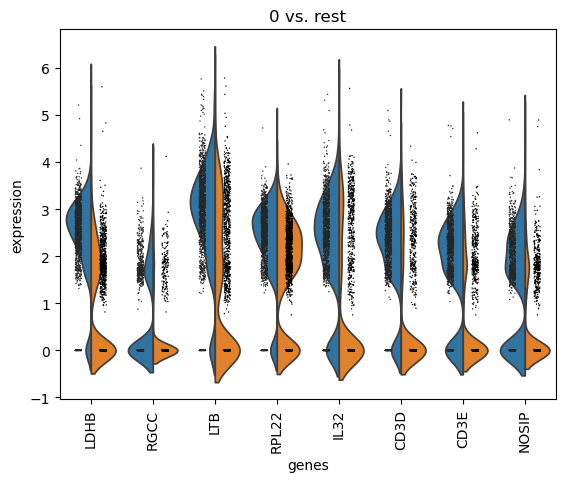

In [35]:
sc.pl.rank_genes_groups_violin(sc_data, groups="0", n_genes=8)

The below violin plots were created to visualize the expression distributions of the genes CST3, NKG7, and PPBP across different Leiden clusters. This plot shows how the expression levels of these specific genes vary among clusters, highlighting differences and similarities in gene expression patterns across the cellular groups.


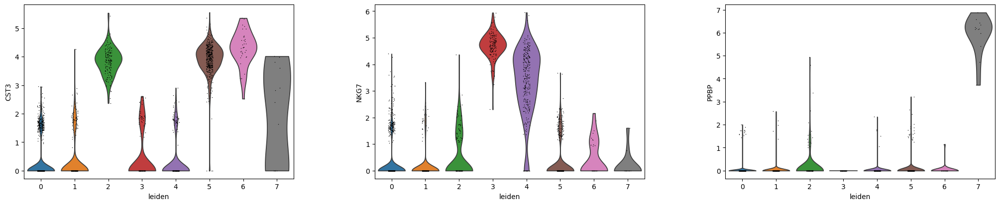

In [36]:
sc.pl.violin(sc_data, ["CST3", "NKG7", "PPBP"], groupby="leiden")

The UMAP plot was generated to visualize the clustering of cells based on the Leiden clusters. 


In [37]:

cell_types = [
    "CD4 T",
    "B cells",
    "FCGR3A+ Monocytes",
    "NK cells",
    "CD8 T",
    "CD14+ Monocytes",
    "Dendritic Cells",
    "Megakaryocytes"
]
sc_data.rename_categories("leiden", cell_types)

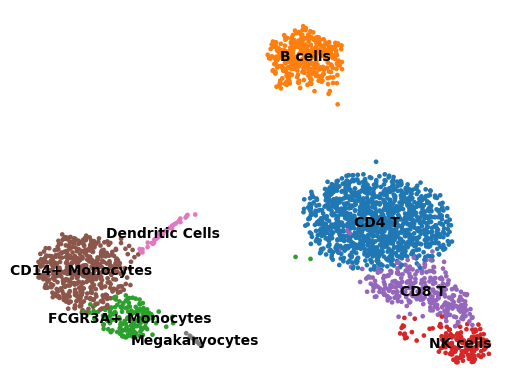

In [38]:
sc.pl.umap(
    sc_data, color="leiden", legend_loc="on data", title="", frameon=False, save=".pdf"
)

A dot plot was created to display the expression levels of selected marker genes across different Leiden clusters. This plot highlights the presence and intensity of gene expression within each cluster, providing a clear visual representation of how each gene is distributed across the identified clusters.


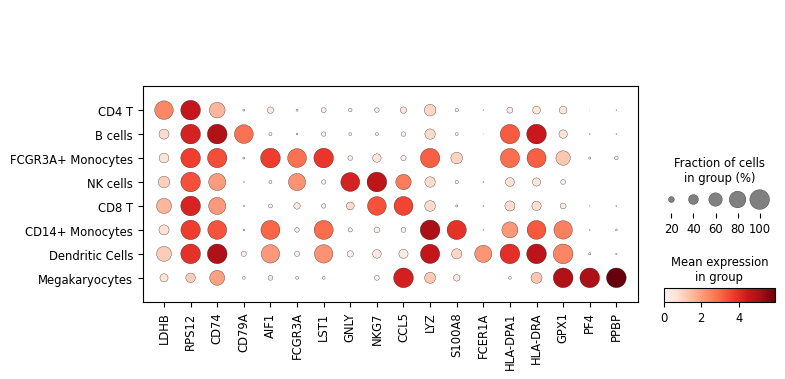

In [39]:
sc.pl.dotplot(sc_data, marker_genes, groupby="leiden");